# Self-Driving Car Engineer Nanodegree
[![Udacity - Self-Driving Car NanoDegree](https://s3.amazonaws.com/udacity-sdc/github/shield-carnd.svg)](http://www.udacity.com/drive)

## Project: **Advanced Lane Finding** 

## 2. Pipeline (single images)

### Import Statements

In [1]:
import os

import cv2
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

import pickle as pl

### Initialisation

In [2]:
#get image names
test_image_list = os.listdir("test_images/")

#create output directories if not existing
for path in ["output_images/calibrated",\
             "output_images/binary_sobelx_colorthresh",\
             "output_images/warped_color",\
             "output_images/warped_binary",\
            "output_images/polyfit"]:

    if not os.path.exists(path):
        os.makedirs(path)

#import estimated camera calibration params
with open ('params/mtx.pl', 'rb') as f:
    mtx = pl.load(f)
with open ('params/dist.pl', 'rb') as f:
    dist = pl.load(f)

### 2.1 Camera Clibration

In [3]:
#iterate over all images and undistort them
for imgname in test_image_list:    
    # read image
    img = mpimg.imread("test_images/"+imgname)
    
    # undistort the image and save it
    dst = cv2.undistort(img, mtx, dist, None, None)
    mpimg.imsave("output_images/calibrated/"+imgname, dst)

#create list of calibrated test images
calibrated_test_image_list = os.listdir("output_images/calibrated")

### 2.2 Binary Mask Developement

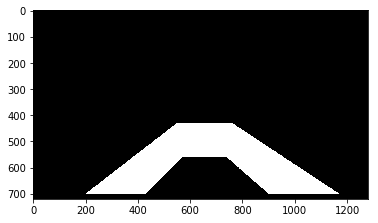

In [4]:
#initialise the parameters of the used region of interest
vertices = np.array([[(550, 430), (760, 430), (1170, 700), (900, 700), 
                      (740, 560), (570, 560), (430, 700), (200, 700)]])

#visualize the used region of interest
mask = np.zeros_like(img[:, :, 0])   

#filling pixels inside the polygon defined by "vertices" with the fill color    
cv2.fillPoly(mask, vertices, 1)

plt.figure()
plt.imshow(mask, cmap='gray')
mpimg.imsave("output_images/intermediate_examples_for_readme/mask.jpg", mask, cmap='gray')

In [5]:
#initialise and export the parameters for color and gradient thresholding
vmin1 = 215
smin1 = 100

sobelx1_min = 4
sobelx1_max = 220

vmin2 = 60

sobelx2_min = 30
sobelx2_max = 220

params = [vmin1, smin1, sobelx1_min, sobelx1_max, sobelx2_min, sobelx2_max, vmin2, vertices]
paramnames = ['vmin1', 'smin1', 'sobelx1_min', 'sobelx1_max', 'sobelx2_min', 'sobelx2_max', 'vmin2', 'vertices']

for param, paramname in zip(params, paramnames):
    with open ('params/'+paramname+'.pl', 'wb') as f:
        pl.dump(param, f)

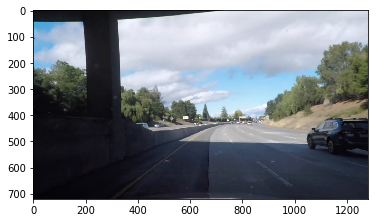

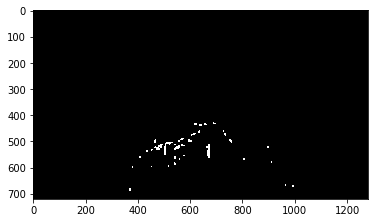

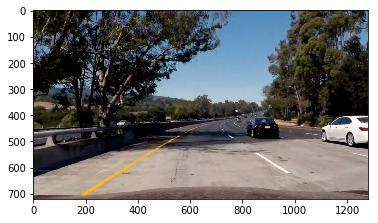

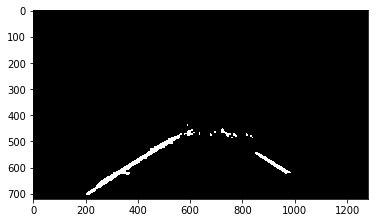

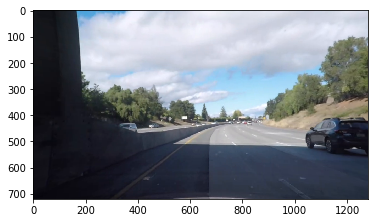

...

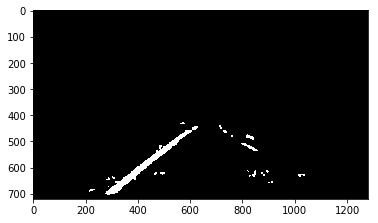

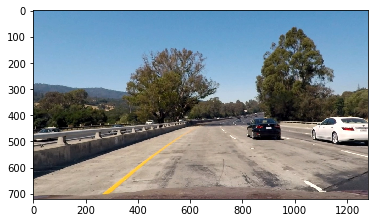

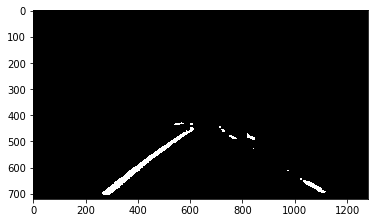

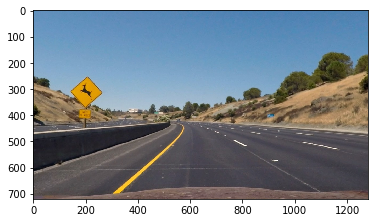

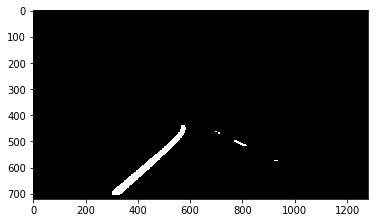

In [6]:
#iterate over test images and perform image processing pipeline
for imgname in calibrated_test_image_list:
    #read image
    img = mpimg.imread("output_images/calibrated/"+imgname)

    #visualize original image
    plt.figure()
    plt.imshow(img)

    #convert the image to hsv color space and extract the channels
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    h = hsv[:, :, 0]
    s = hsv[:, :, 1]
    v = hsv[:, :, 2]

    colorthresh = np.zeros_like(v)
    colorthresh[(v>vmin1)|(s>smin1)] = 1

    colorthresh2 = np.zeros_like(v)
    colorthresh2[v>vmin2] = 1

    #sobel x
    sobelx = cv2.Sobel(v, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    #apply a very soft margin on the gradient ensuring, that detected pixels are at least slightly part of an vertical structure
    #suppressing shadows withot vertical preferential direction
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sobelx1_min) & (scaled_sobel <= sobelx1_max)] = 1

    sobelx2 = cv2.Sobel(s, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx2 = np.absolute(sobelx2) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel2 = np.uint8(255*abs_sobelx2/np.max(abs_sobelx2))
    
    sxbinary2 = np.zeros_like(scaled_sobel2)
    sxbinary2[(scaled_sobel2 >= sobelx2_min) & (scaled_sobel2 <= sobelx2_max)] = 1

    #defining a blank mask for the region of interest
    mask = np.zeros_like(colorthresh)   
    
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, 1)

    #combine color and gradient thresholds and region of interest mask
    combined_binary = np.zeros_like(colorthresh)
    combined_binary[(((colorthresh == 1) & (sxbinary == 1))|((colorthresh2 == 1)&(sxbinary2 == 1))) & (mask == 1)] = 1

    #blurring suppresses noise
    blurred = cv2.GaussianBlur(combined_binary, (5, 5), 0)

    #init kernel for morphological operations
    kernel = np.ones((5,5),np.uint8)

    #dilatation fills pixels within structures
    dilation = cv2.dilate(blurred,kernel,iterations = 2)
    #erosion sharpens the edges of structures
    erosion = cv2.erode(dilation,kernel,iterations = 1)

    #visualize binary pipeline output
    plt.figure()
    plt.imshow(erosion, cmap='gray')

    mpimg.imsave("output_images/binary_sobelx_colorthresh/"+imgname, erosion, cmap='gray')
    
#create list of unwarped binary images
binary_image_list = os.listdir("output_images/binary_sobelx_colorthresh")

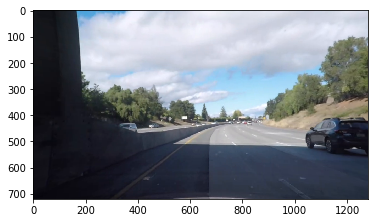

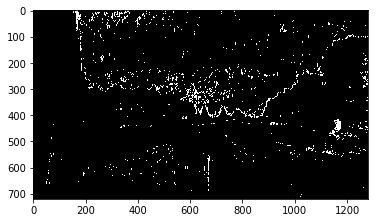

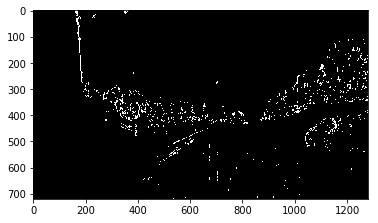

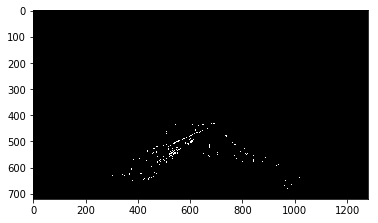

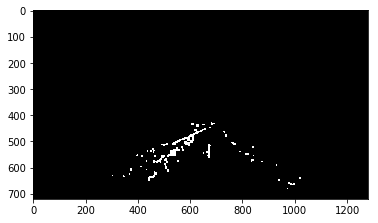

In [7]:
#stepwise solution generating examples for the readme
img = mpimg.imread("output_images/calibrated/challenging.jpg")

#visualize original image
plt.figure()
plt.imshow(img)

#convert the image to hsv color space and extract the channels
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

h = hsv[:, :, 0]
s = hsv[:, :, 1]
v = hsv[:, :, 2]

colorthresh = np.zeros_like(v)
colorthresh[(v>vmin1)|(s>smin1)] = 1

colorthresh2 = np.zeros_like(v)
colorthresh2[v>vmin2] = 1

#sobel x
sobelx = cv2.Sobel(v, cv2.CV_64F, 1, 0) # Take the derivative in x
abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

#apply a very soft margin on the gradient ensuring, that detected pixels are at least slightly part of an vertical structure
#suppressing shadows withot vertical preferential direction
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= sobelx1_min) & (scaled_sobel <= sobelx1_max)] = 1

sobelx2 = cv2.Sobel(s, cv2.CV_64F, 1, 0) # Take the derivative in x
abs_sobelx2 = np.absolute(sobelx2) # Absolute x derivative to accentuate lines away from horizontal
scaled_sobel2 = np.uint8(255*abs_sobelx2/np.max(abs_sobelx2))

sxbinary2 = np.zeros_like(scaled_sobel2)
sxbinary2[(scaled_sobel2 >= sobelx2_min) & (scaled_sobel2 <= sobelx2_max)] = 1


combined_1 = np.zeros_like(colorthresh)
combined_1[((colorthresh == 1) & (sxbinary == 1))] = 1

combined_2 = np.zeros_like(colorthresh)
combined_2[((colorthresh2 == 1)&(sxbinary2 == 1))] = 1


plt.figure()
plt.imshow(combined_1, cmap='gray')

plt.figure()
plt.imshow(combined_2, cmap='gray')
    

#defining a blank mask for the region of interest
mask = np.zeros_like(colorthresh)   

#filling pixels inside the polygon defined by "vertices" with the fill color    
cv2.fillPoly(mask, vertices, 1)

#combine color and gradient thresholds and region of interest mask
combined_binary = np.zeros_like(colorthresh)
combined_binary[(((colorthresh == 1) & (sxbinary == 1))|((colorthresh2 == 1)&(sxbinary2 == 1))) & (mask == 1)] = 1

plt.figure()
plt.imshow(combined_binary, cmap='gray')


#blurring suppresses noise
blurred = cv2.GaussianBlur(combined_binary, (5, 5), 0)

#init kernel for morphological operations
kernel = np.ones((5,5),np.uint8)

#dilatation fills pixels within structures
dilation = cv2.dilate(blurred,kernel,iterations = 2)
#erosion sharpens the edges of structures
erosion = cv2.erode(dilation,kernel,iterations = 1)

#visualize binary pipeline output
plt.figure()
plt.imshow(erosion, cmap='gray')


mpimg.imsave("output_images/intermediate_examples_for_readme/challenging_combined_1.jpg", combined_1, cmap='gray')
mpimg.imsave("output_images/intermediate_examples_for_readme/challenging_combined_2.jpg", combined_2, cmap='gray')
mpimg.imsave("output_images/intermediate_examples_for_readme/challenging_combined_binary.jpg", combined_binary, cmap='gray')
mpimg.imsave("output_images/intermediate_examples_for_readme/challenging_binary_final.jpg", erosion, cmap='gray')

### 2.3 Perspective Transform

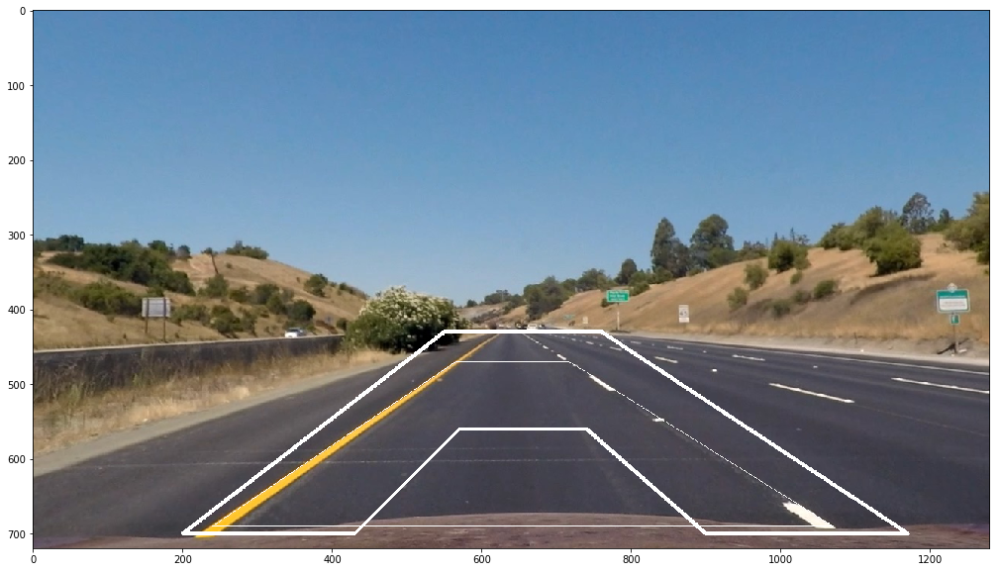

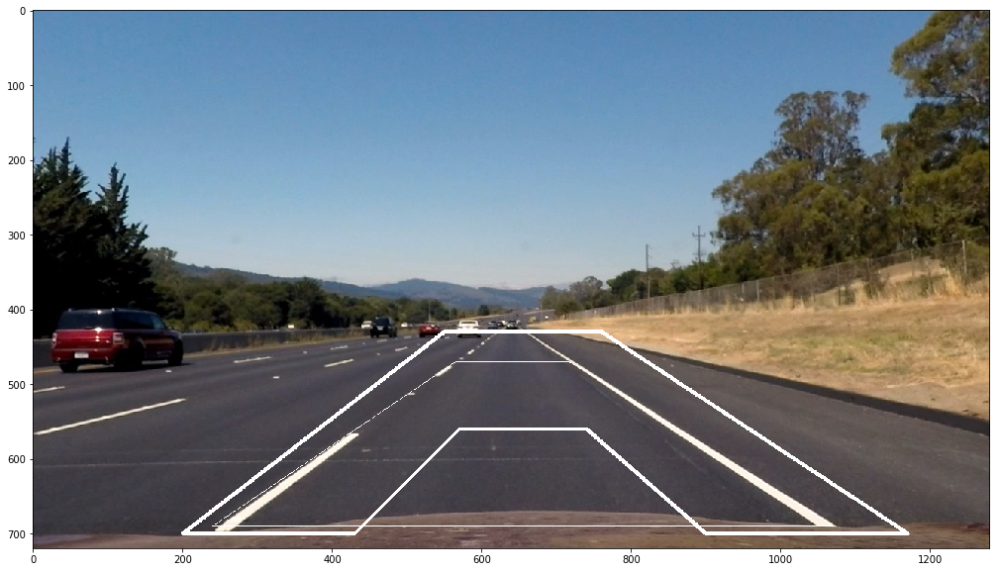

In [8]:
#determine the edges of an polygon in the image space, which should be a rectangle in a perspective transformed space
vertices_perpective = np.array([[(565, 470), (717, 470), (1070, 690), (240, 690)]], np.int16)

#visualize the polygon as overlay at two example images to verify the fit and show the region of interest mask in addition
img1 = mpimg.imread("output_images/calibrated/straight_lines1.jpg")

cv2.polylines(img1, [vertices], True, (255,255,255), thickness=3)
cv2.polylines(img1, np.int32([vertices_perpective]), True, (255,255,0), thickness=1)

plt.figure(figsize=(20,10))
plt.imshow(img1)


img2 = mpimg.imread("output_images/calibrated/straight_lines2.jpg")

cv2.polylines(img2, [vertices], True, (255,255,255), thickness=3)
cv2.polylines(img2, np.int32([vertices_perpective]), True, (255,255,0), thickness=1)

plt.figure(figsize=(20,10))
plt.imshow(img2)

#dump the image to be used in the readme 
mpimg.imsave("output_images/intermediate_examples_for_readme/determine_perspective_transform_vertex.jpg", img2)

In [9]:
#determine image size
(ysize, xsize) = np.shape(img2[:, :, 0])

#define array of destination points
offset_up = 100
offset_lo = 30
offset_l = 240
offset_r = 210
dst = np.float32([[offset_l, offset_up], [xsize-offset_r, offset_up],\
[xsize-offset_r, ysize-offset_lo], [offset_l, ysize-offset_lo]])

#convert polygon corners to array of float32 elements
src = np.array(vertices_perpective[0], np.float32)

# determine the transform matrix M and its reverse M_rev
M = cv2.getPerspectiveTransform(src, dst)
M_rev = cv2.getPerspectiveTransform(dst, src)

#dump transformation matrix M and image size
with open ('params/M.pl', 'wb') as f:
    pl.dump(M, f)
    
#dump transformation matrix M and image size
with open ('params/M_rev.pl', 'wb') as f:
    pl.dump(M_rev, f)
    
with open ('params/ysize.pl', 'wb') as f:
    pl.dump(ysize, f)
    
with open ('params/xsize.pl', 'wb') as f:
    pl.dump(xsize, f)

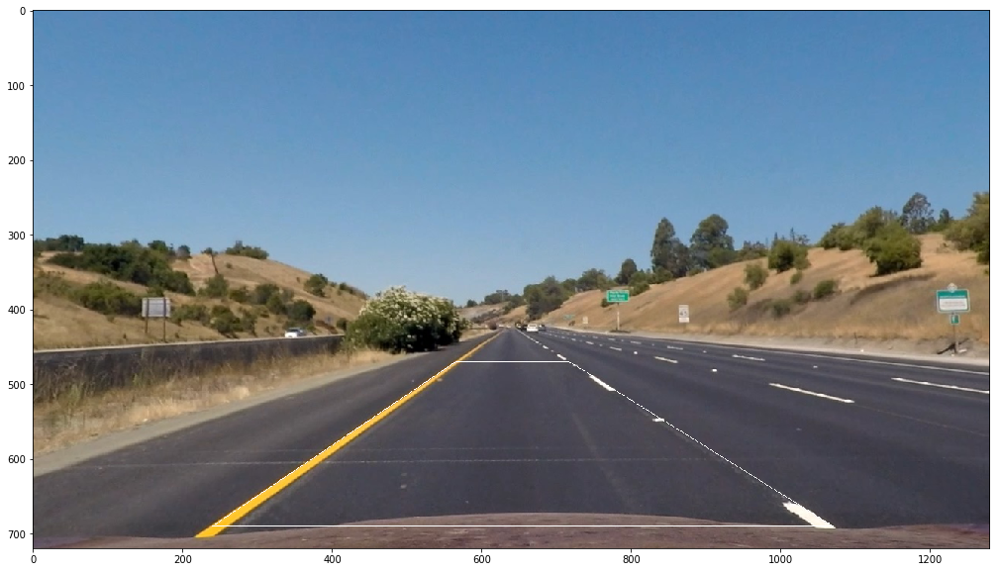

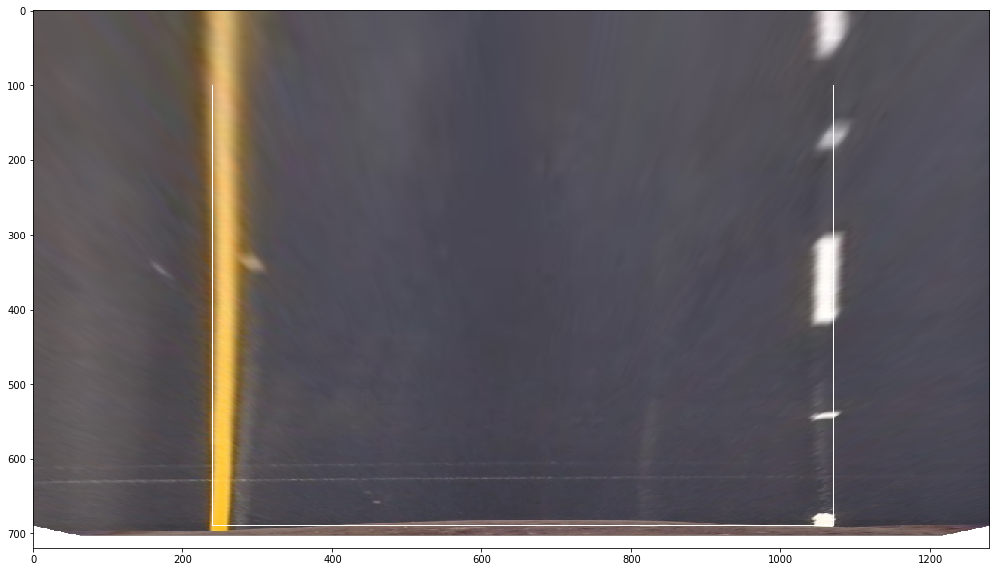

In [10]:
#apply defined perspective transformation to one of the straight line examples
img1 = mpimg.imread("output_images/calibrated/straight_lines1.jpg")

img1_with_lines = np.copy(img1)
cv2.polylines(img1_with_lines, np.int32([vertices_perpective]), True, (255,255,0), thickness=1)


mpimg.imsave("output_images/intermediate_examples_for_readme/straight_lines1_perspective_transform_vertex.jpg", img1_with_lines)

#show original image
plt.figure(figsize=(20,10))
plt.imshow(img1_with_lines)

#show warped image
warped = cv2.warpPerspective(img1, M, (xsize, ysize), flags=cv2.INTER_LINEAR)
cv2.polylines(warped, np.int32([dst]), True, (255,255,0), thickness=1)

plt.figure(figsize=(20,10))
plt.imshow(warped)

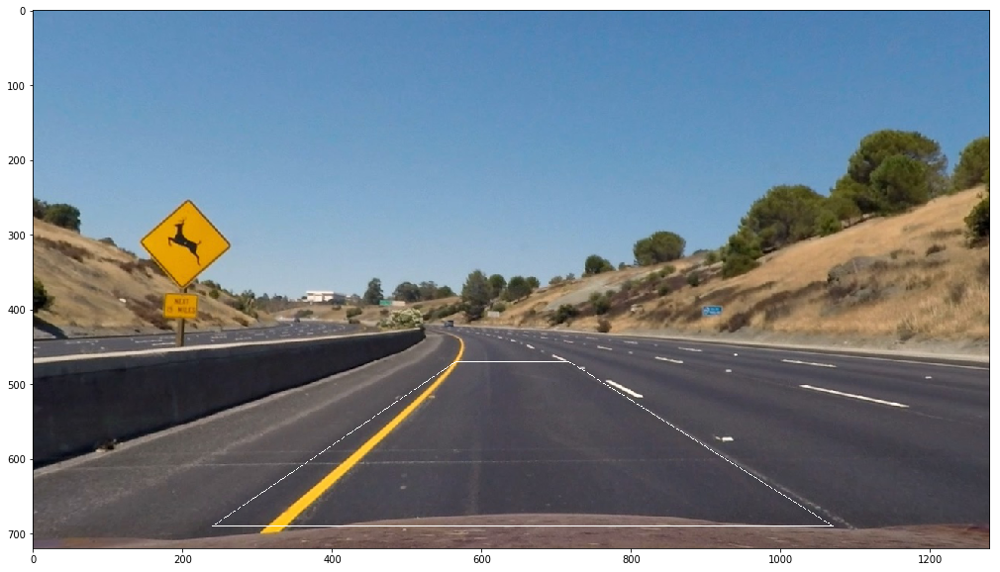

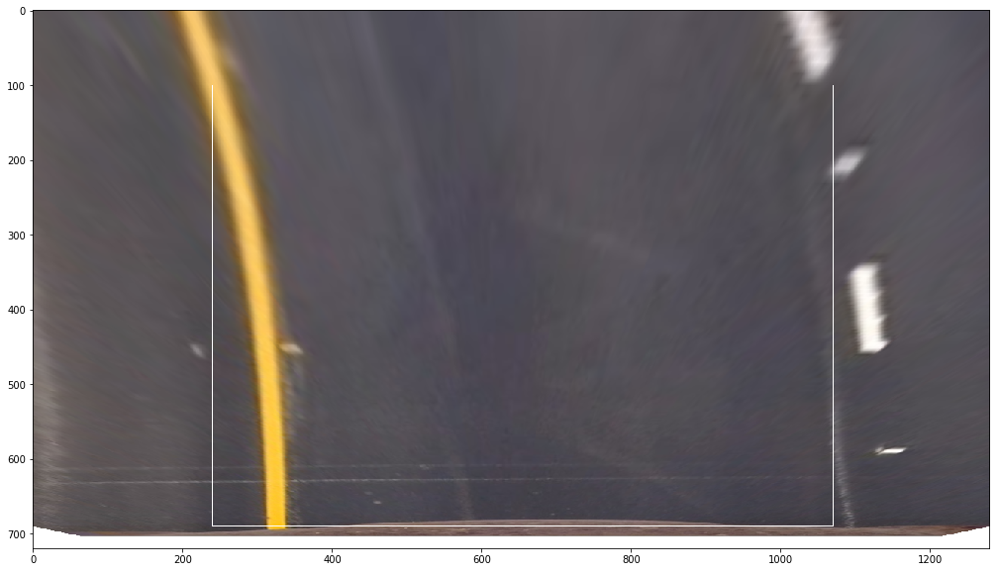

In [11]:
#apply the defined perspective transformation to an example with a curvy road
img1 = mpimg.imread("output_images/calibrated/test2.jpg")

img1_with_lines = np.copy(img1)
cv2.polylines(img1_with_lines, np.int32([vertices_perpective]), True, (255,255,0), thickness=1)

mpimg.imsave("output_images/intermediate_examples_for_readme/test2_perspective_transform_vertex.jpg", img1_with_lines)


#show original image
plt.figure(figsize=(20,10))
plt.imshow(img1_with_lines)

#show warped image
warped = cv2.warpPerspective(img1, M, (xsize, ysize), flags=cv2.INTER_LINEAR)
cv2.polylines(warped, np.int32([dst]), True, (255,255,0), thickness=1)

plt.figure(figsize=(20,10))
plt.imshow(warped)

In [12]:
#iterate over test images, apply the perspective transformation and dump the images
for imgname in calibrated_test_image_list:
    #read image
    img = mpimg.imread("output_images/calibrated/"+imgname)
    
    #show warped image
    warped = cv2.warpPerspective(img, M, (xsize, ysize), flags=cv2.INTER_LINEAR)
    cv2.polylines(warped, np.int32([dst]), True, (255,255,0), thickness=1)

    #dump the images
    mpimg.imsave("output_images/warped_color/"+imgname, warped)

#iterate over binary images, apply the perspective transformation and dump the images
for imgname in binary_image_list:
    # read image
    img = mpimg.imread("output_images/binary_sobelx_colorthresh/"+imgname)
    
    #show warped image
    warped = cv2.warpPerspective(img, M, (xsize, ysize), flags=cv2.INTER_LINEAR)
    
    #dump the images
    mpimg.imsave("output_images/warped_binary/"+imgname, warped)    
    
    cv2.polylines(warped, np.int32([dst]), True, (255,255,0), thickness=1)

    #dump the images with lines
    mpimg.imsave("output_images/warped_binary/"+imgname[:-4]+"_with_line.jpg", warped)

### 2.4 Identifying lane-line pixels and polynomial fitting

In [13]:
def find_lane_pixels(binary_warped):
    #determine a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    #find the peak of the left and right halves of the histogram
    #these will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    #define the number of sliding windows
    nwindows = 9
    #set the width of the windows +/- margin
    margin = 100
    #set minimum number of pixels found to recenter window
    minpix = 50

    #set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    #identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    #current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    #create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    #create empty lists to receive lower and upper boundaries of the estimated windows
    returnWindows_low = []
    returnWindows_high = []
    
    #step through the windows one by one
    for window in range(nwindows):
        #identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        
        win_xleft_low = leftx_current-margin
        win_xleft_high = leftx_current+margin
        win_xright_low = rightx_current-margin
        win_xright_high = rightx_current+margin
        
        #append the windows to the lists collecting them to be returned
        returnWindows_low.append((win_xleft_low, win_y_low))
        returnWindows_high.append((win_xleft_high, win_y_high))
        
        returnWindows_low.append((win_xright_low, win_y_low))
        returnWindows_high.append((win_xright_high, win_y_high))
        
        #identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        #append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        #if you found > minpix pixels, recenter next window
        #(`right` or `leftx_current`) on their mean position
        if len(good_left_inds)>minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds)>minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
    #concatenate the arrays of indices (previously was a list of lists of pixels)
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    #extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return (leftx, lefty), (rightx, righty), returnWindows_low, returnWindows_high


def fit_polynomial(left, right, deg=2):
    #fit polynomial of degree deg to both lane markings
    try:
        left_fit = np.polyfit(left[1], left[0], deg)
    except:
        left_fit = None
    try:
        right_fit = np.polyfit(right[1], right[0], deg)
    except:
        right_fit = None
        
    if left_fit is None and right_fit is not None:
        left_fit = np.copy(right_fit)
        left_fit[-1] -= 800
        
    if left_fit is not None and right_fit is None:
        right_fit = np.copy(left_fit)
        right_fit[-1] += 800
        
    return left_fit, right_fit

    
def visualize_polyfit(binary_warped, deg=2, colorize_markings=True, show_windows=True,\
                      suppress_noise=False, colorize_lane=False):
    
    #check if the degree is set to 2 or 3 otherwise replace the value
    if deg<1:
        deg = 2
    elif deg>3:
        deg = 3
    
    #determine the pixels belonging to the left and right marking
    left, right, returnWindows_low, returnWindows_high = find_lane_pixels(binary_warped)
    #fit polynomial of degree deg to both lane markings
    left_fit, right_fit = fit_polynomial(left, right, deg)
    
    #init output image
    if suppress_noise:
        #without the pixels which were identified as noise
        out_img = np.dstack((np.zeros_like(binary_warped), np.zeros_like(binary_warped), np.zeros_like(binary_warped)))
    else:
        #without all pixels
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))

    if colorize_markings:
        #colorize pixels belonging to the markings
        out_img[left[1], left[0]] = [255, 0, 0]
        out_img[right[1], right[0]] = [0, 0, 255]
    
    if show_windows:
        #add windows on top of the output_images
        for wind_low, wind_high in zip(returnWindows_low, returnWindows_high):
            cv2.rectangle(out_img, wind_low, wind_high, (0,255,0), 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )

    if deg==2:
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty
    else:
        try:
            left_fitx = left_fit[0]*ploty**3 + left_fit[1]*ploty**2 + left_fit[2]*ploty + left_fit[3]
            right_fitx = right_fit[0]*ploty**3 + right_fit[1]*ploty**2 + right_fit[2]*ploty + right_fit[3]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty


    #change format of x and y points
    pts_l = []
    pts_r = []
    for x_l, x_r, y in zip(left_fitx, right_fitx, ploty):
        pts_l.append([x_l, y])
        pts_r.append([x_r, y])

    pts_l=np.int32(np.array([pts_l]))
    pts_r=np.int32(np.array([pts_r]))
    
    #plot fitted polynomials
    cv2.polylines(out_img, pts_l, False, (255, 255, 0), thickness=2)
    cv2.polylines(out_img, pts_r, False, (255, 255, 0), thickness=2)

    #colorize pixels inside the lane
    if colorize_lane:
        lane_mask = np.zeros_like(out_img)

        arr = []
        for el in pts_l[0]:
            arr.append(el)
        for el in np.flip(pts_r[0], 0):
            arr.append(el)
        
        arr = np.array([arr])
        
        cv2.fillPoly(lane_mask, arr, (0, 255, 255))
        cv2.addWeighted(out_img, 0.5, lane_mask, 0.2, 0.0, out_img)
        

    return out_img

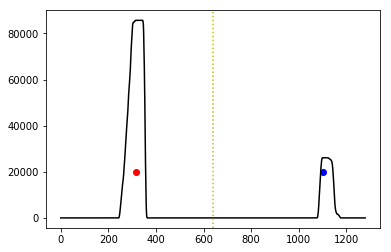

In [14]:
#load an example image
binary_warped = mpimg.imread("output_images/warped_binary/test2.jpg")[:,:,0]

#create the histogram used in the find_lane_pixels() function, visualize and save it to be used in the readme
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

midpoint = np.int(histogram.shape[0]//2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

plt.figure()
plt.plot(histogram, c='k')
plt.axvline(midpoint, c='y', ls=':')
plt.scatter([leftx_base], [20000], c='r')
plt.scatter([rightx_base], [20000], c='b')


plt.savefig("output_images/intermediate_examples_for_readme/hist_test2.jpg")

plt.show()

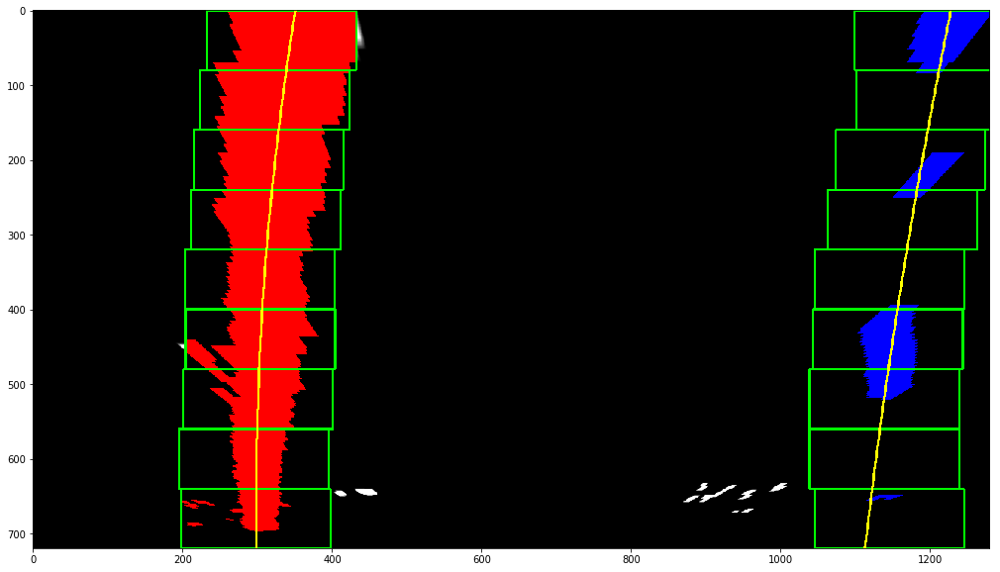

In [15]:
#load an example image
binary_warped = mpimg.imread("output_images/warped_binary/test4.jpg")[:,:,0]

#calculate image with fitted polynomials and visualized intermediate steps and visualize it
out_img = visualize_polyfit(binary_warped, deg=2, colorize_markings=True, show_windows=True,\
                            suppress_noise=False, colorize_lane=False)

plt.figure(figsize=(20,10))
plt.imshow(out_img)



#iterate over all warped binary images performing the above steps and dump the result images
for imgname in binary_image_list:
    binary_warped = mpimg.imread("output_images/warped_binary/"+imgname)[:,:,0]

    out_img = visualize_polyfit(binary_warped, deg=2, colorize_markings=True, show_windows=True,\
                                suppress_noise=False, colorize_lane=False)
    
    mpimg.imsave("output_images/polyfit/"+imgname, out_img)

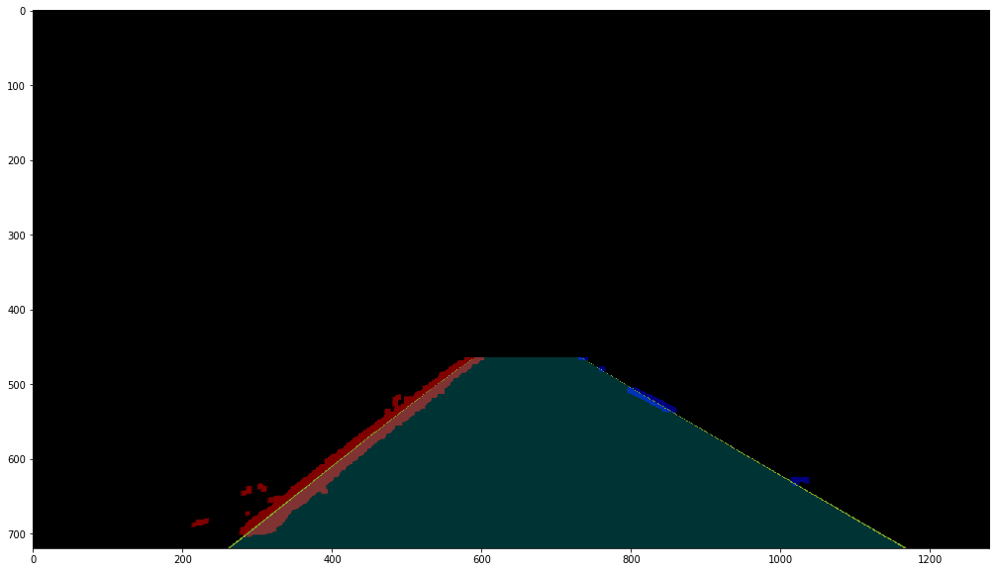

In [16]:
#load an example image
binary_warped = mpimg.imread("output_images/warped_binary/test4.jpg")[:,:,0]

#calculate image with fitted polynomials
out_img_noboxes = visualize_polyfit(binary_warped, deg=2, colorize_markings=True, show_windows=False,\
                                    suppress_noise=True, colorize_lane=True)

#rewarp the image
rewarped_out_img = cv2.warpPerspective(out_img_noboxes, M_rev, (xsize, ysize), flags=cv2.INTER_LINEAR)

#visualize the image
plt.figure(figsize=(20,10))
plt.imshow(rewarped_out_img)

#iterate over all warped binary images performing the above steps and dump the result images
for imgname in binary_image_list:
    binary_warped = mpimg.imread("output_images/warped_binary/"+imgname)[:,:,0]
    out_img_noboxes = visualize_polyfit(binary_warped, deg=2, colorize_markings=True, show_windows=False,\
                                        suppress_noise=True, colorize_lane=True)
    rewarped_out_img = cv2.warpPerspective(out_img_noboxes, M_rev, (xsize, ysize), flags=cv2.INTER_LINEAR)
    mpimg.imsave("output_images/polyfit/"+imgname[:-4]+"_rewarped.jpg", rewarped_out_img)

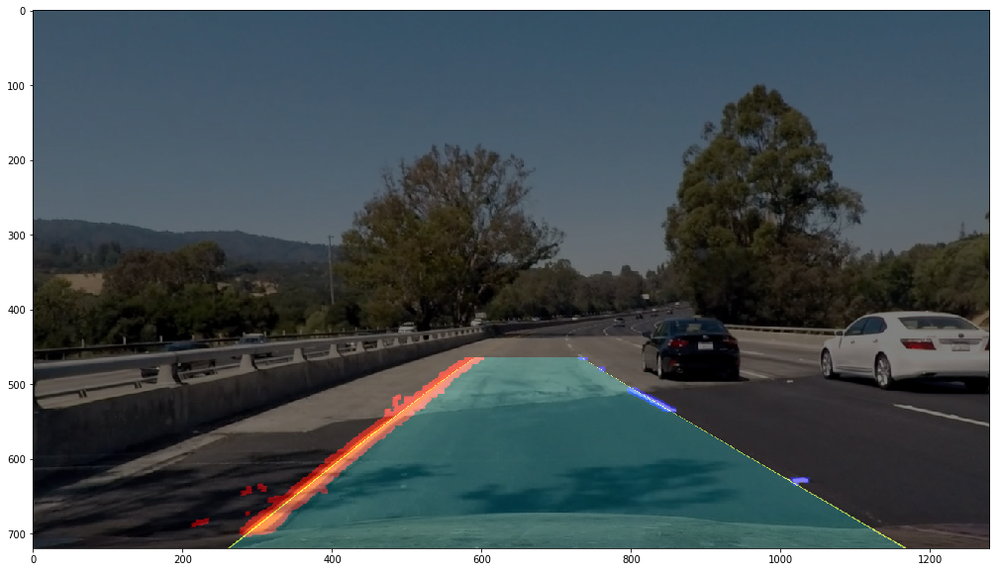

In [17]:
#load an example image
binary_warped = mpimg.imread("output_images/warped_binary/test4.jpg")[:,:,0]

#calculate image with fitted polynomials
out_img_noboxes = visualize_polyfit(binary_warped, deg=2, colorize_markings=True, show_windows=False,\
                                    suppress_noise=True, colorize_lane=True)

#rewarp the image
rewarped_out_img = cv2.warpPerspective(out_img_noboxes, M_rev, (xsize, ysize), flags=cv2.INTER_LINEAR)

orig_img = mpimg.imread("output_images/calibrated/test4.jpg")
conv = cv2.cvtColor(orig_img, cv2.COLOR_BGRA2BGR)

cv2.addWeighted(conv, 0.5, rewarped_out_img, 1.0, 0.0, conv)

#visualize the image
plt.figure(figsize=(20,10))
plt.imshow(conv)



for imgname in binary_image_list:
    binary_warped = mpimg.imread("output_images/warped_binary/"+imgname)[:,:,0]
    out_img_noboxes = visualize_polyfit(binary_warped, deg=2, colorize_markings=True, show_windows=False,\
                                        suppress_noise=True, colorize_lane=True)
    rewarped_out_img = cv2.warpPerspective(out_img_noboxes, M_rev, (xsize, ysize), flags=cv2.INTER_LINEAR)
    orig_img = mpimg.imread("output_images/calibrated/"+imgname)
    conv = cv2.cvtColor(orig_img, cv2.COLOR_BGRA2BGR)
    cv2.addWeighted(conv, 0.5, rewarped_out_img, 1.0, 0.0, conv)
    mpimg.imsave("output_images/polyfit/"+imgname[:-4]+"_overlayed.jpg", conv)

### 2.5 Determine the curvature of the road

In [27]:
def measure_curvature(y_eval, left_fit, right_fit):
    '''
    Calculates the curvature of polynomial functions in pixels or with the correct input in meters
    '''
    
    left_curverad = ((1+(2*left_fit[0]*y_eval+left_fit[1])**2)**(3/2))/np.abs(2*left_fit[0])
    right_curverad = ((1+(2*right_fit[0]*y_eval+right_fit[1])**2)**(3/2))/np.abs(2*right_fit[0]) 
    
    return left_curverad, right_curverad


def visualize_polyfit(binary_warped, deg=2, colorize_markings=True, show_windows=True,\
                      suppress_noise=False, colorize_lane=False, rewarp=False, show_crv=False):
    
    #check if the degree is set to 2 or 3 otherwise replace the value
    if deg<1:
        deg = 2
    elif deg>3:
        deg = 3
    
    #determine the pixels belonging to the left and right marking
    left, right, returnWindows_low, returnWindows_high = find_lane_pixels(binary_warped)
    #fit polynomial of degree deg to both lane markings
    left_fit, right_fit = fit_polynomial(left, right, deg)
    
    #init output image
    if suppress_noise:
        #without the pixels which were identified as noise
        out_img = np.dstack((np.zeros_like(binary_warped), np.zeros_like(binary_warped), np.zeros_like(binary_warped)))
    else:
        #without all pixels
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))

    if colorize_markings:
        #colorize pixels belonging to the markings
        out_img[left[1], left[0]] = [255, 0, 0]
        out_img[right[1], right[0]] = [0, 0, 255]
    
    if show_windows:
        #add windows on top of the output_images
        for wind_low, wind_high in zip(returnWindows_low, returnWindows_high):
            cv2.rectangle(out_img, wind_low, wind_high, (0,255,0), 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )

    if deg==2:
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty
    else:
        try:
            left_fitx = left_fit[0]*ploty**3 + left_fit[1]*ploty**2 + left_fit[2]*ploty + left_fit[3]
            right_fitx = right_fit[0]*ploty**3 + right_fit[1]*ploty**2 + right_fit[2]*ploty + right_fit[3]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty


    #change format of x and y points
    pts_l = []
    pts_r = []
    for x_l, x_r, y in zip(left_fitx, right_fitx, ploty):
        pts_l.append([x_l, y])
        pts_r.append([x_r, y])

    pts_l=np.int32(np.array([pts_l]))
    pts_r=np.int32(np.array([pts_r]))
    
    #plot fitted polynomials
    cv2.polylines(out_img, pts_l, False, (255, 255, 0), thickness=2)
    cv2.polylines(out_img, pts_r, False, (255, 255, 0), thickness=2)

    #colorize pixels inside the lane
    if colorize_lane:
        lane_mask = np.zeros_like(out_img)

        arr = []
        for el in pts_l[0]:
            arr.append(el)
        for el in np.flip(pts_r[0], 0):
            arr.append(el)
        
        arr = np.array([arr])
        
        cv2.fillPoly(lane_mask, arr, (0, 255, 255))
        cv2.addWeighted(out_img, 0.5, lane_mask, 0.2, 0.0, out_img)

    if rewarp:
        out_img = cv2.warpPerspective(out_img, M_rev, (xsize, ysize), flags=cv2.INTER_LINEAR)
        
    if show_crv:
        #calculate curvature of the road
    
        #define conversions in x and y from pixels space to meters
        #mask for perspective tranbsform ranges from x=240 to x=1070 and covers one lane (approx 3.7m) and the markings
        ##1070-240-10=820
        xm_per_pix = 3.7/820 # meters per pixel in x dimension
        ym_per_pix = 30/720 # meters per pixel in y dimension

        #fit the polynomials another time but now in meters instead of pixels
        left_fit_cr, right_fit_cr = fit_polynomial([left[0]*xm_per_pix, left[1]*ym_per_pix],\
                                                   [right[0]*xm_per_pix, right[1]*ym_per_pix], 2)

        #set the y value for the evaluation to the maximum value and convert it to meters
        y_eval = np.max(ploty)*ym_per_pix

        #calculate the curvatures in meters
        crv = np.round(measure_curvature(y_eval, left_fit_cr, right_fit_cr),2)
        
        #calculate the points belonging to the to lanes at the bottom of the image in meters
        x0_l = left_fit_cr[0]*y_eval**2 + left_fit_cr[1]*y_eval + left_fit_cr[2]
        x0_r = right_fit_cr[0]*y_eval**2 + right_fit_cr[1]*y_eval + right_fit_cr[2]
        
        #calculate the position of the lane center, the distances to the lane markings and the width of the lane
        lanecenter = x0_r-x0_l
        dist_lm = np.abs(lanecenter-x0_l)
        dist_rm = np.abs(lanecenter-x0_r)
        width = x0_r-x0_l

        #calculate the distance to the lane center accoriding ISO definition with positive values if the vehicle is 
        #on the left of the lane center and negative values if the vehicle is right to the lane center
        dist_cl = dist_rm - (width/2)
        
        reliability_l = np.min([1.0, len(left[0])/80000])
        reliability_r = np.min([1.0, len(right[0])/80000])
        
        
        #put the generated information as text overlay on the image
        cv2.putText(out_img,\
                    'Width of the Lane = '+str(np.round(width,2))+'m',\
                    (100, 70), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
        
        cv2.putText(out_img,\
                    'Radius of Curvature = '+str(crv[np.argmax([reliability_l, reliability_r])])+'m',\
                    (100, 120), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
        
        cv2.putText(out_img,\
                    'Distance to Lane Center = '+str(np.round(dist_cl, 2))+'m',\
                    (100, 170), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
        
        
        cv2.putText(out_img,\
                    'reliability left = '+str(np.round(reliability_l, 2)),\
                    (100, 220), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
        
        cv2.putText(out_img,\
                    'reliability right = '+str(np.round(reliability_r, 2)),\
                    (100, 270), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)

    return(out_img)

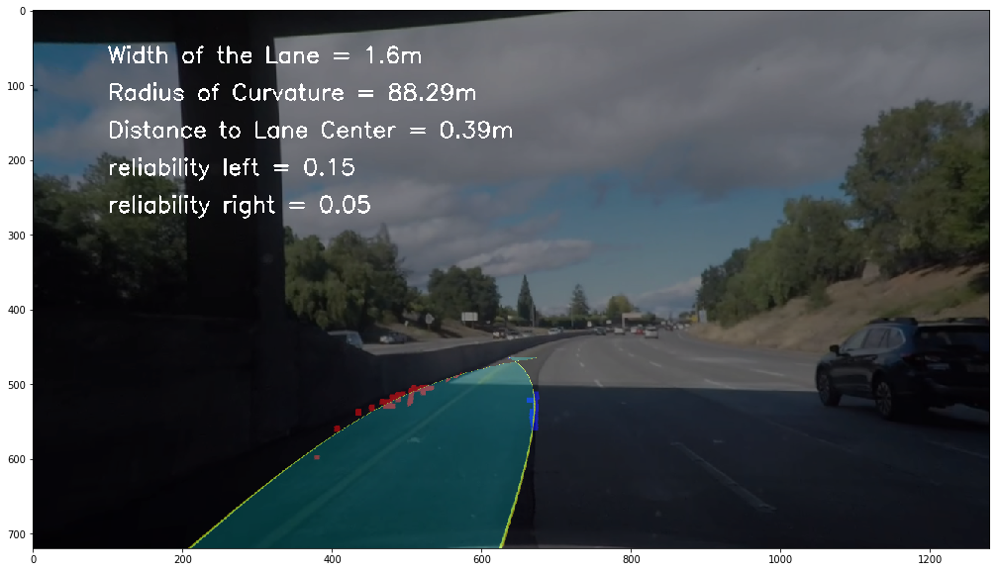

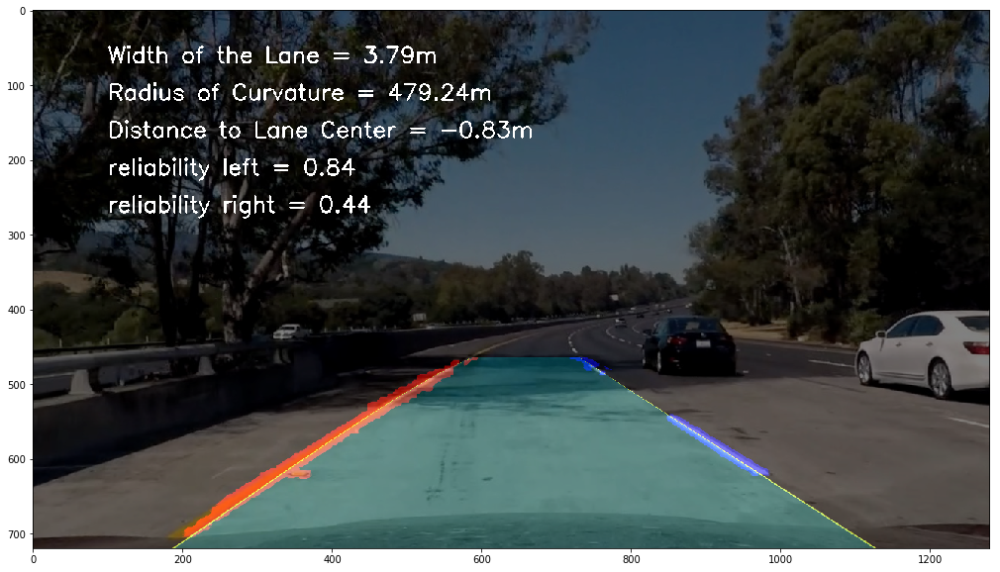

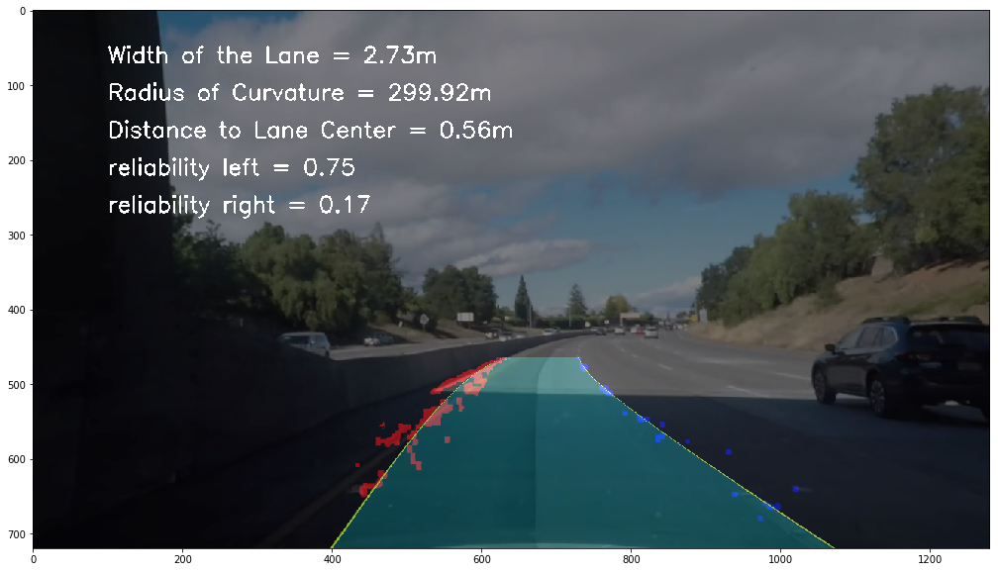

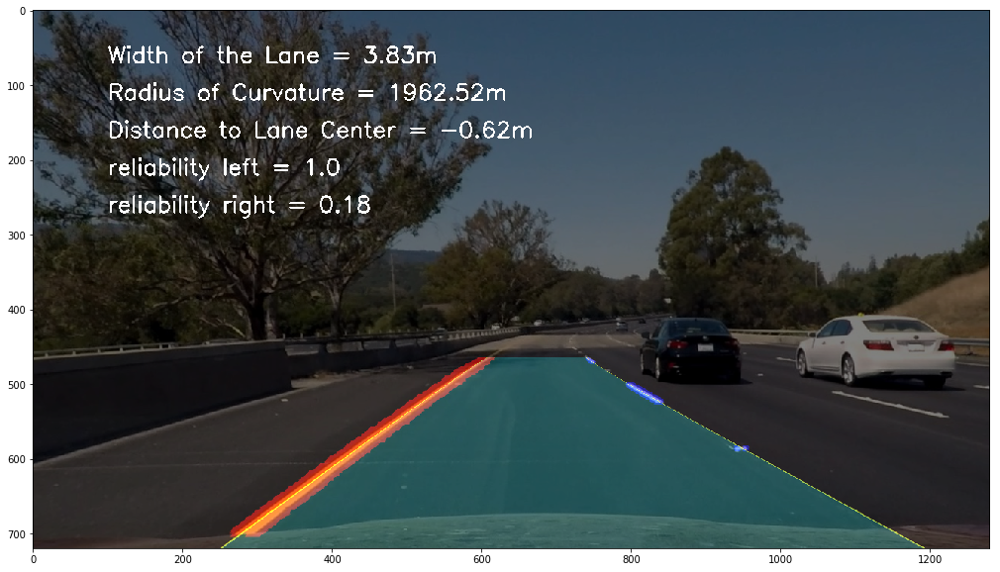

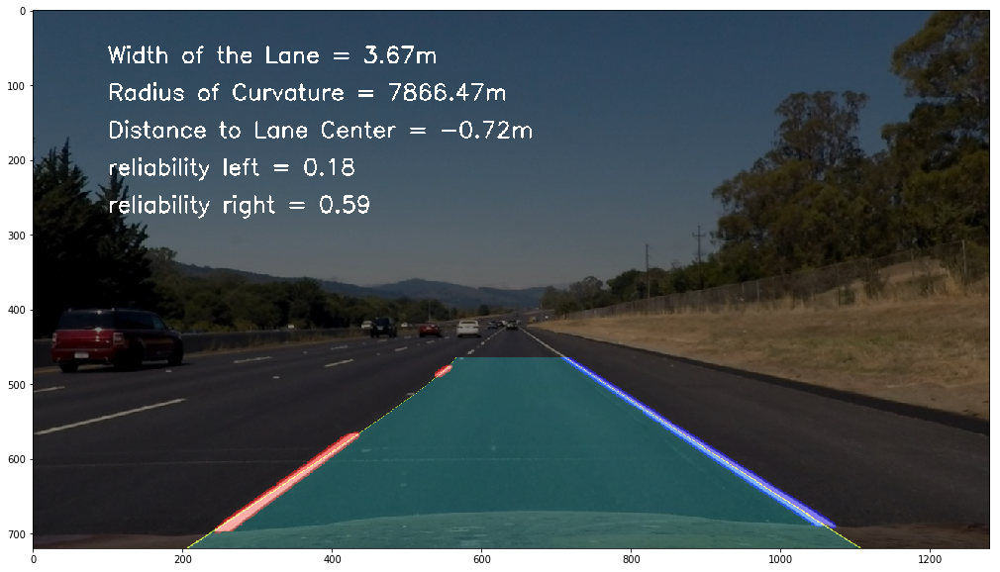

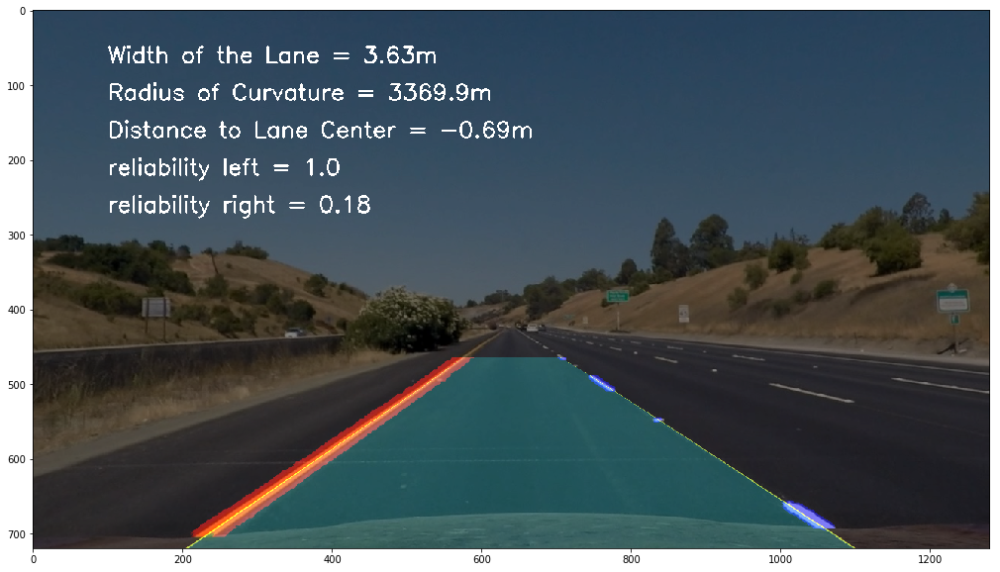

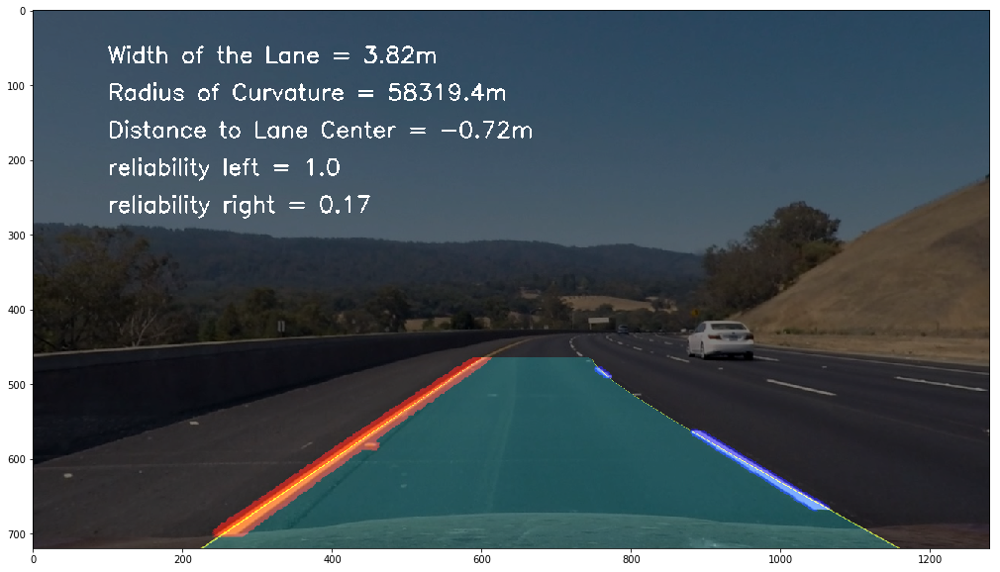

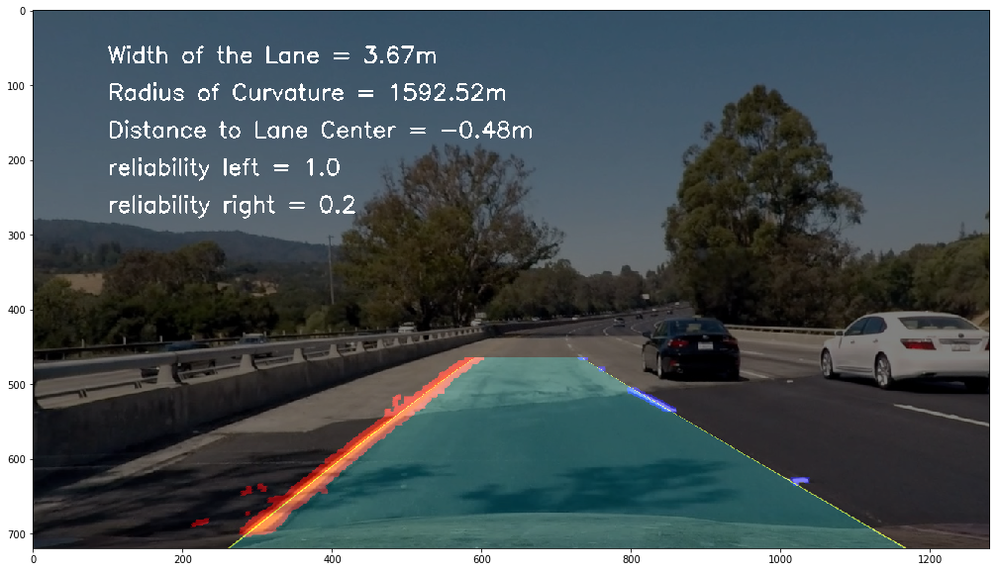

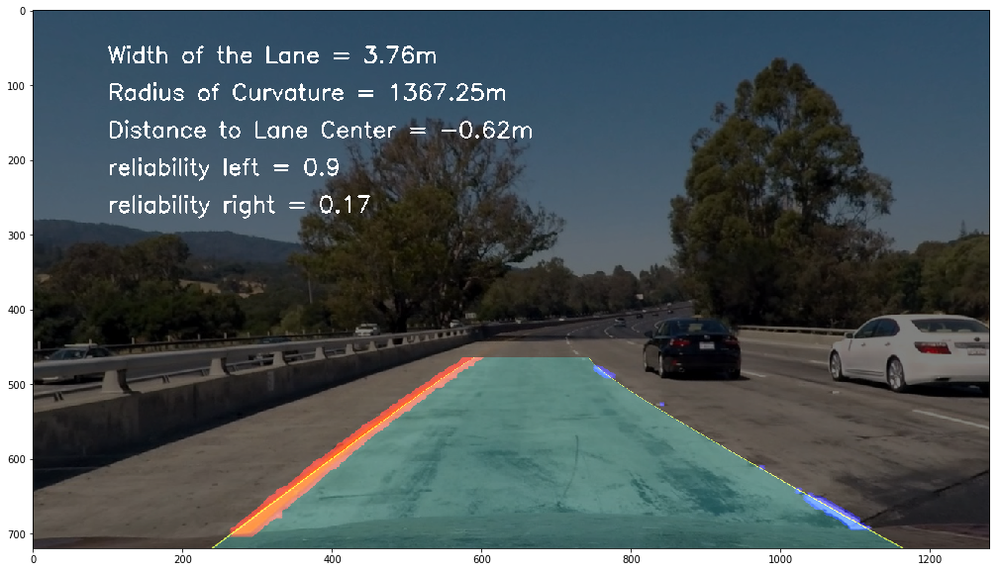

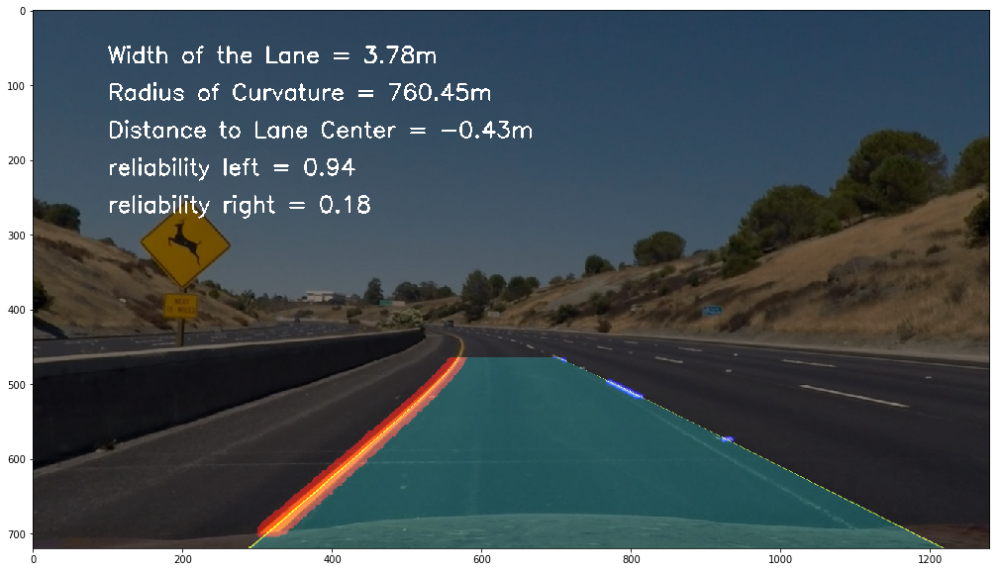

In [28]:
#load an example image
#binary_warped = mpimg.imread("output_images/warped_binary/straight_lines1.jpg")[:,:,0]

for imgname in binary_image_list:
    binary_warped = mpimg.imread("output_images/warped_binary/"+imgname)[:,:,0]


    #calculate rewarped image with fitted polynomials and curvature
    rewarped_out_img = visualize_polyfit(binary_warped, deg=2, colorize_markings=True, show_windows=False,\
                                        suppress_noise=True, colorize_lane=True, rewarp=True, show_crv=True)

    orig_img = mpimg.imread("output_images/calibrated/"+imgname)
    conv = cv2.cvtColor(orig_img, cv2.COLOR_BGRA2BGR)

    cv2.addWeighted(conv, 0.5, rewarped_out_img, 1.0, 0.0, conv)

    #visualize the image
    plt.figure(figsize=(20,10))
    plt.imshow(conv)
    
    mpimg.imsave("output_images/polyfit/"+imgname[:-4]+"_overlayed_withcrv.jpg", conv)